<table>
<tr>    
<td style="text-align: center">
<h1>Konwolucyjne sieci neuronowe<br />wizualizacja reprezentacji danych uczących:<br />filtry, wyjścia i obszary decyzyjne.</h1>
<h2><a href="http://home.agh.edu.pl/~horzyk/index.php">Adrian Horzyk</a></h2>
</td> 
<td>
<img src="http://home.agh.edu.pl/~horzyk/im/AdrianHorzyk49BT140h.png" alt="Adrian Horzyk, Professor" title="Adrian Horzyk, Professor" />        
</td> 
</tr>
</table>
<h3><i>Zapraszam do interaktywnego notebooka, w którym możesz dowiedzieć się, jak działają sieci neuronowe, doświadczysz i sprawdzisz ich działanie na wybranych zbiorach danych i przeprowadzisz własne eksperymenty!</i></h3>

# Wizualizacja tego, czego uczą się sieci ConvNet (CNN)

Często mówi się, że modele uczenia głębokiego to „czarne skrzynki”, reprezentujące dane uczące, które trudno wyodrębnić i przedstawić w formie czytelnej dla człowieka. Chociaż jest to częściowo prawdziwe w przypadku niektórych typów modeli uczenia głębokiego, zdecydowanie nie jest to prawdą w przypadku sieci convnet. Reprezentacje wyuczone przez convnety są bardzo podatne na wizualizację, w dużej mierze dlatego, że są _reprezentacjami koncepcji wizualnych_. Od 2013 roku opracowano szeroki wachlarz technik wizualizacji i interpretacji tych reprezentacji. Zwizualizowane reprezentacje danych treningowych (filtry) pomagają nam znaleźć pewne problemy z adaptacją i uogólnieniem, dlatego konieczne jest użycie wizualizacji do sprawdzenia wytrenowanych modeli w celu znalezienia możliwych sposobów poprawy. Nie przeanalizujemy wszystkich z nich, ale omówimy trzy z najbardziej dostępnych i przydatnych:

<ol>
    <li><b>Wizualizacja pośrednich danych wyjściowych warstw sieci convnet („pośrednie aktywacje”).</b> Jest to przydatne, aby zrozumieć, w jaki sposób kolejne warstwy convnet przekształcają ich dane wejściowe, i uzyskać pierwsze pojęcie o znaczeniu poszczególnych filtrów convnet.</ li>
    <li><b>Wizualizacja filtrów sieci konwulsyjnych.</b> Jest to przydatne, aby dokładnie zrozumieć, jaki wzorzec wizualny lub koncepcja jest podatna na każdy filtr w sieci konwersyjnej.</li>
    <li><b>Wizualizacja map cieplnych aktywacji klas na obrazie.</b> Jest to przydatne, aby zrozumieć, która część obrazu została zidentyfikowana jako należąca do danej klasy (obszar decyzyjny), a tym samym umożliwia zlokalizowanie obiektów na obrazach.</li >
</ol>

Aby je zademonstrować, użyjemy problemu klasyfikacji kotów vs. psów z convnetami trenowanymi podczas naszych poprzednich zajęć lub przetransferowaną konwolucyjną bazą sieci VGG-16 wyszkoloną na danych treningowych imagenet.

In [1]:
import tensorflow as tf
import keras

print ("TensorFlow version: " + tf.__version__)
print ("Keras version: " + keras.__version__)

TensorFlow version: 2.9.1
Keras version: 2.9.0


## 1. Wizualizacja pośrednich aktywacji

Wizualizacja pośrednich aktywacji polega na wyświetlaniu map cech, które są generowane przez różne warstwy splotowe (konwolucyjne) i poolingu w sieci dla określonego wejścia. Wyjście warstwy jest często nazywane jej <b>aktywacją</b>, tj. wyjściem funkcji aktywacji. Daje nam to wgląd w to, jak dane wejściowe są rozkładane na różne filtry wyuczone przez sieć. Możemy też zauważyć te filtry, które nie zostały jeszcze dobrze zaadaptowane. Te mapy obiektów, które chcemy zwizualizować, mają 3 wymiary: szerokość, wysokość i głębokość (3 kanały). Każdy kanał koduje stosunkowo niezależne funkcje, więc właściwym sposobem wizualizacji tych map cech jest niezależne wykreślenie zawartości każdego kanału jako obrazu 2D.

Wizualizacja wyjść pozwala nam też na wykrycie <b>„martwych” komórek (neuronów)</b>, które nie biorą udziału (lub w bardzo ograniczonym stopniu) w procesie klasyfikacji i uczenia, ponieważ rzadko lub nigdy nie wygrywają w rywalizacji z innymi filtrami w warstwach MaxPooling. Może to wyglądać jak <b>choroba Alzheimera lub Parkinsona struktury CNN</b>. Jest to bardzo istotne z punktu widzenia rozróżniania i wydajności, ponieważ "martwe" komórki ograniczają pojemność i zdolność trenowania modelu, zwiększając pamięć i zużycie energii, nie robiąc nic pożytecznego! Jeżeli na wyjściu filtru widzimy reakcję zerową, powinniśmy sprawdzić powiązany z nim filtr, czy reprezentuje on jakiś sensowny wzór, czy tylko biały szum generowany przez liczby pseudolosowe podczas inicjalizacji wagi. Jeśli biały szum, to oznacza to, że filtr prawdopodobnie nie był modyfikowany od początku procesu uczenia i taki filtr jest nieprzydatny („martwy”).

Zacznijmy od wczytania np. `model2` (lub własnego - zalecane), który zapisaliśmy na poprzednich zajęciach. Jednak w swoich eksperymentach zdecydowanie zaleca się użycie najlepszego modelu osiągniętego i zapisanego podczas poprzednich eksperymentów.

In [2]:
#import os

# When using Google drive
#from google.colab import drive
#drive.mount('/content/drive', force_remount=True)

#root_dir = '/content/drive/MyDrive/Notebooks/...'
#train_dir = os.path.join(root_dir, 'TrainData')
#test_dir = os.path.join(root_dir, 'TestData')

In [3]:
from keras.models import load_model

# The directory where we will store our smaller dataset
base_dir = 'C:/ml/data/kaggle/processed/cats_and_dogs_small'

# The directory where we will store our models
# It can be downloaded from 'https://home.agh.edu.pl/~horzyk/ml/models/'
models_dir = 'C:/ml/models/'

model = load_model(models_dir + 'cats_and_dogs_small_2.h5')

model.summary()  # Show a reminder of this model.

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_15 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_16 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 17, 17, 128)     

Użyjemy jednego z obrazów kota z bioru testowego jako nasz obraz wejściowy, czyli nie takiego, na których trenowano sieć:

In [4]:
import numpy as np

# It can be downloaded from 'https://home.agh.edu.pl/~horzyk/ml/data/kaggle/processed/cats_and_dogs_small/test/cats/cat.1700.jpg'
#img_path = base_dir + '/test/cats/cat.1700.jpg'
img_path = base_dir + '/test/cats/cat.1863.jpg' # Możesz wybrać sobie innego kota, a nawet psa tutaj

# We preprocess the image into a 4D tensor
from tensorflow.keras.preprocessing import image

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs that were preprocessed in the following way, so we must do the same now:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


Jak wygląda nasz załadowany obraz "kotek"?

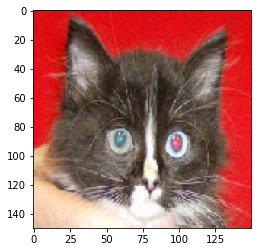

In [5]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

Aby wyodrębnić mapy obiektów, utworzymy model Keras, który pobiera partie (batches) obrazów jako dane wejściowe i wyjściowe
aktywacje wszystkich warstw konwolucyjnych i poolingowych. W tym celu użyjemy klasy Keras `Model`, która jest tworzona przy użyciu dwóch argumentów: tensora wejściowego (lub listy tensorów wejściowych) i tensora wyjściowego (lub listy tensorów wyjściowych). Otrzymaną klasą jest model Keras, podobnie jak modele „sekwencyjne”, mapujący określone wejścia na określone wyjścia. Tym, co wyróżnia klasę `Model`, jest to, że pozwala ona na modele z __wieloma wyjściami__, w przeciwieństwie do `Sekwencyjnego`.

In [6]:
from keras import models

# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:8]]

# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

Po podaniu obrazu wejściowego model ten zwraca wartości aktywacji warstw (wyjścia warstw) w oryginalnym modelu. Być może po raz pierwszy spotykasz się <b>modelem o wielu wyjściach</b>. Do tej pory modele, z którymi pracowaliśmy, miały dokładnie jedno wejście i jedno wyjście. W ogólnym przypadku model może mieć dowolną liczbę wejść i wyjść. Ten ma jedno wejście i 8 wyjść, po jednym wyjściu na aktywację warstwy.

In [7]:
# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)

1/1 [==============================] - 0s 280ms/step


Na przykład przeprowadźmy aktywację pierwszej warstwy splotowej dla naszego wejścia obrazu naszego kota:

In [8]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


Jest to mapa cech 148x148 z 32 kanałami. Spróbujmy zwizualizować pięć przykładowych kanałów:

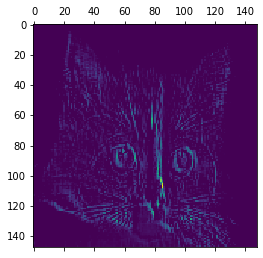

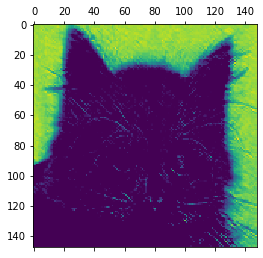

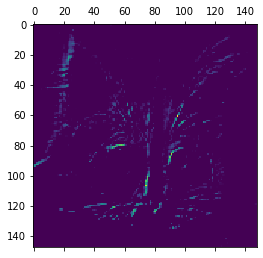

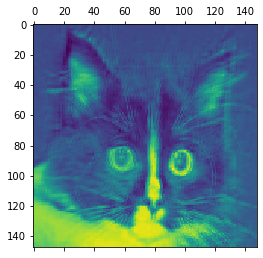

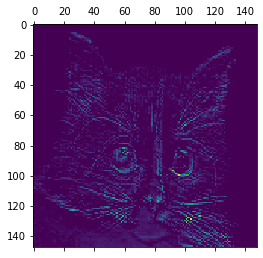

In [9]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 0], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 6], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 9], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 12], cmap='viridis')
plt.show()

Jak widzimy, kanały te kodują i wykrywają różne cechy (przedstawione jako jasne punkty).

Narysujmy pełną wizualizację wszystkich aktywacji w sieci. Wyodrębnijmy i wykreślmy każdy kanał na każdej z naszych 8 map aktywacji, a wyniki ułóżmy w jeden duży tensor obrazu, z kanałami ułożonymi obok siebie.

C:\Users\Adrian\AppData\Local\Temp/ipykernel_18892/4044860947.py:27: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


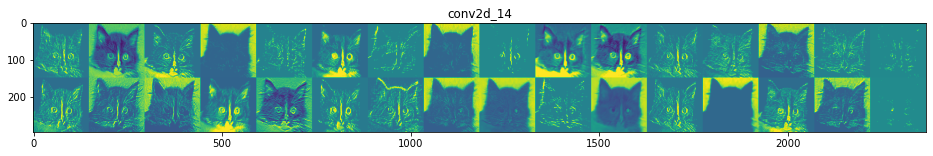

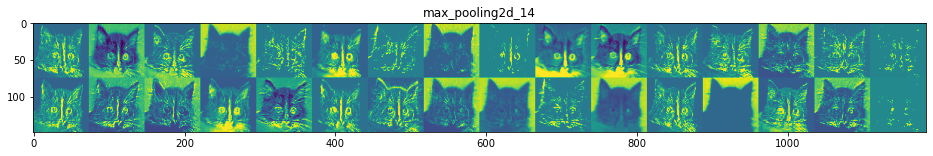

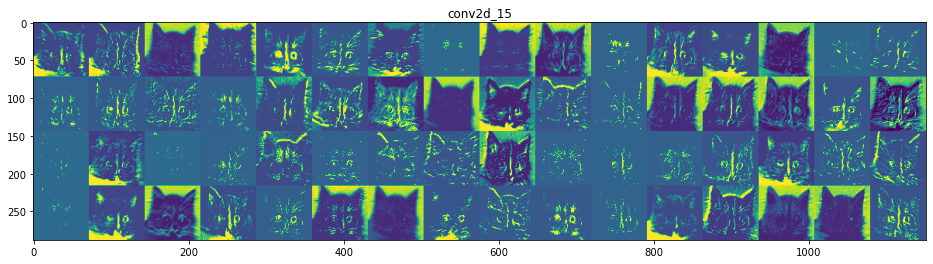

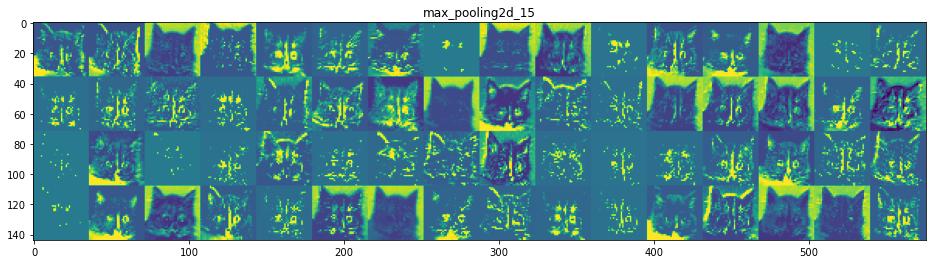

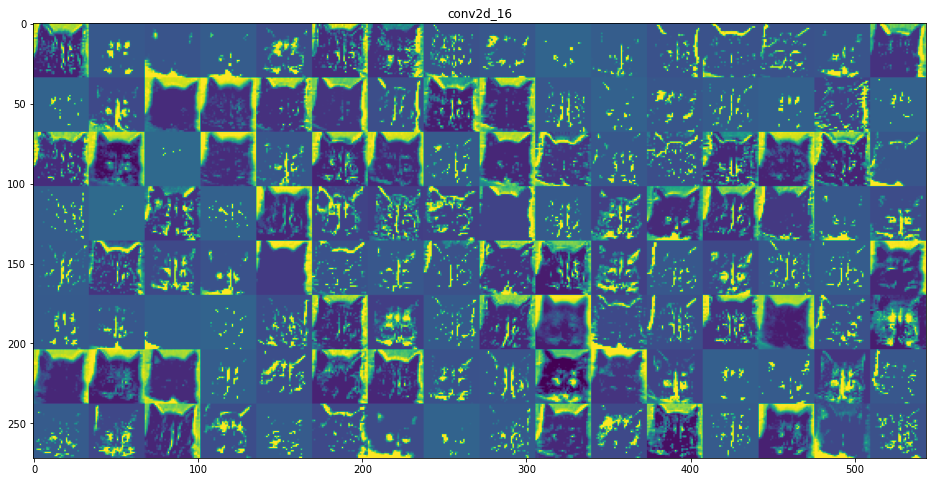

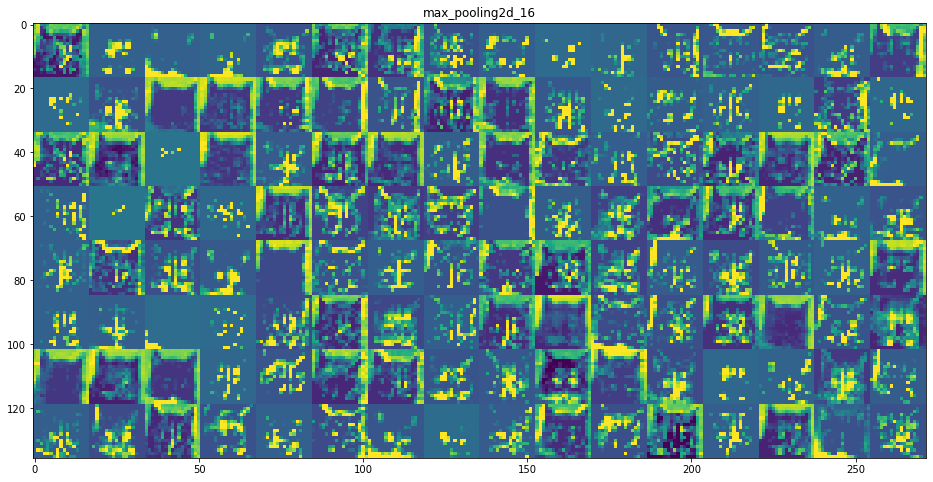

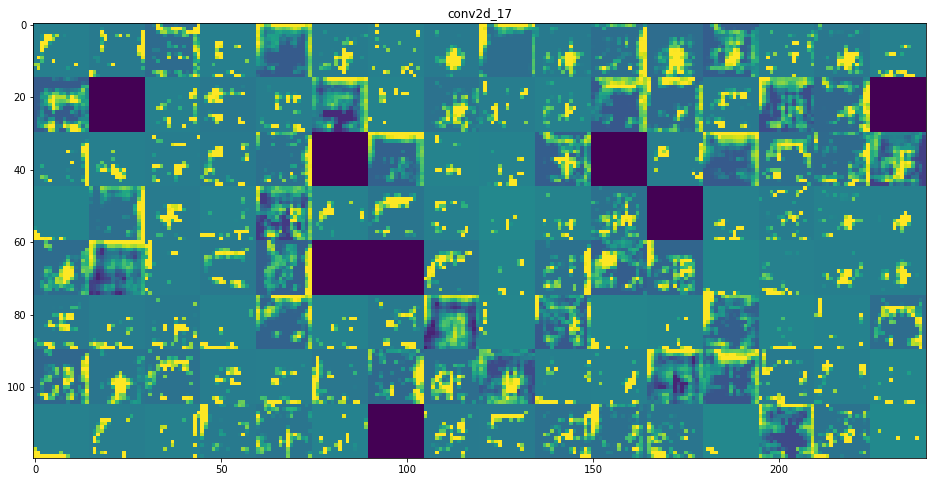

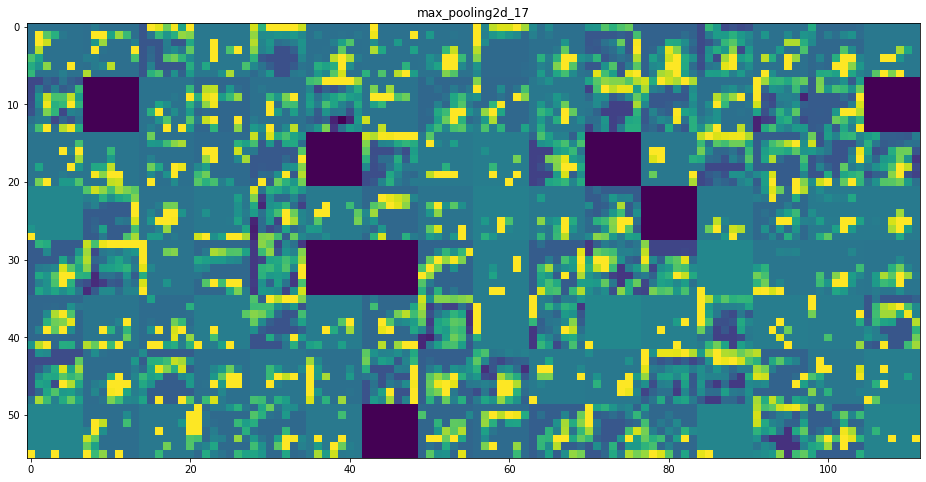

In [10]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features (channels) in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, size * images_per_row))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

### Uwagi:

* Pierwsza warstwa działa jako zbiór różnych detektorów krawędzi. Na tym etapie aktywacje nadal zachowują prawie wszystkie informacje obecne w początkowym obrazie.
* W miarę jak wchodzimy wyżej (do kolejnych warstw sieci), aktywacje stają się coraz bardziej abstrakcyjne i trudniejsze do wizualnej interpretacji. Zaczynają kodować pojęcia/wzorce wyższego poziomu, takie jak „kocie ucho” czy „kocie oko”. Wyższe prezentacje niosą ze sobą coraz mniej informacji o treści wizualnej obrazu, a coraz więcej informacji związanych z klasą obrazu i jego reprezentacją.
* Rzadkość aktywacji rośnie wraz z głębokością/wysokością warstwy: w pierwszej warstwie prawie wszystkie filtry są aktywowane przez obraz wejściowy, ale w kolejnych warstwach coraz więcej filtrów jest zwykle pustych (czarne prostokąty). Oznacza to, że wzór zakodowany przez filtr nie znajduje się w obrazie wejściowym. (Ale uwaga na sytuacje, gdy dany filtr zbyt często lub zawsze generuje takie sytuacje - "brak reakcji".)
* Możemy zauważyć, że czasami niektóre filtry są do siebie bardzo podobne; w rezultacie kodują podobne cechy/wzorce. Może to ograniczyć właściwości dyskryminacyjne sieci, więc być może warstwy powinny zostać "odblokowane", aby trenować lepszą reprezentację i dyskryminację cech zestawu danych.
* Czasami jasne piksele są widoczne na zewnątrz ciała kota. Oznacza to, że klasyfikacja kotów jest przetwarzana na podstawie cech środowiska/otoczenia/tła, w którym koty były zwykle fotografowane! Czasami może to być zaletą, ale innym razem (zwykle) może to być poważny problem, więc pamiętaj, aby zwracać uwagę na takie jasne cechy poza sklasyfikowanymi obiektami.
* Funkcje wyodrębnione przez warstwę stają się coraz bardziej abstrakcyjne wraz z głębokością/wysokością warstwy. Aktywacje warstw wyżej niosą ze sobą coraz mniej informacji o konkretnym wejściu (obrazie), a coraz więcej o celu (klasie obrazu: w naszym przypadku cechach/wzorcach kotów lub psów). Głęboka sieć neuronowa skutecznie działa jak __potok destylacji informacji__, z surowymi danymi (w naszym przypadku obrazy RGB) i wielokrotnie przekształcanymi, dzięki czemu nieistotne informacje są odfiltrowywane (np. określony wygląd obrazu), podczas gdy są przydatne informacje zostają powiększone i udoskonalone (np. specyfika klasy obrazu).

Przedstawiony proces jest analogiczny do sposobu postrzegania świata przez ludzi i zwierzęta: po kilkusekundowej obserwacji danej sceny człowiek pamięta, jakie obiekty abstrakcyjne się w niej znajdowały (np. rower, drzewo), ale nie potrafi zachować w pamięci specyficznego wyglądu tych obiektów (wszystkich szczegółów). W rzeczywistości, gdybyś teraz spróbował narysować typowy rower ze swojego umysłu, prawdopodobnie nie byłbyś w stanie zrobić tego nawet w przybliżeniu dobrze, mimo że widziałeś tysiące rowerów w swoim życiu. Spróbuj narysować rower: ten efekt jest absolutnie realny. Twój mózg nauczył się całkowicie abstrahować dane wizualne, przekształcać je w koncepcje wizualne wysokiego poziomu, jednocześnie całkowicie odfiltrowując nieistotne szczegóły wizualne, co sprawia, że niezwykle trudno jest zapamiętać, jak rzeczy wokół nas naprawdę wyglądają.

## 2. Wizualizacja filtrów convnet

Inną istotną rzeczą dotyczącą sprawdzania filtrów wyuczonych przez convnet jest wyświetlenie ich wzorca wizualnego, na który każdy filtr ma reagować. Można to zrobić za pomocą __wzrostu gradientu w przestrzeni wejściowej__: stosując __spadek gradientu__ do wartości obrazu wejściowego sieci convnet, aby zmaksymalizować odpowiedź określonego filtra, zaczynając od pustego obrazu wejściowego. Wynikowy obraz wejściowy byłby taki, na który wybrany filtr reaguje maksymalnie.

W tym celu zbudujemy funkcję straty, która maksymalizuje wartość danego filtra w danej warstwie konwolucyjnej (splotowej); następnie użyjemy stochastycznego spadku gradientu, aby dostosować wartości obrazu wejściowego tak, aby zmaksymalizować tę wartość aktywacji.

Na przykład, oto strata dla aktywacji filtra 0 w warstwie „block3_conv1” sieci VGG16, wstępnie wytrenowanej na zbiorze ImageNet:

In [11]:
#from keras.applications import VGG16
from tensorflow.keras.applications import VGG16
#from keras import backend as K
from tensorflow.keras import backend as K
tf.compat.v1.disable_eager_execution()

model = VGG16(weights='imagenet', include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

Aby zaimplementować `spadek gradientu`, będziemy potrzebować gradientu tej straty w odniesieniu do danych wejściowych tego modelu. W tym celu użyjemy funkcji `gradients` zawartej w module `backend` Kerasa:

In [12]:
# The call to `gradients` returns a list of tensors (of size 1 in this case)
# hence we only keep the first element, which is a tensor.
grads = K.gradients(loss, model.input)[0]
#grads = K.GradientTape(loss, model.input)[0]
# https://github.com/tensorflow/tensorflow/issues/33135

Nieoczywistą sztuczką, aby proces opadania gradientu przebiegał płynnie, jest znormalizowanie tensora gradientu poprzez podzielenie go przez jego normę L2 (pierwiastek kwadratowy (square root) ze średniej kwadratowej wartości w tensorze). Zapewnia to, że wielkość aktualizacji obrazu wejściowego zawsze mieści się w tym samym zakresie.

In [13]:
# We add 1e-5 before dividing so as to avoid accidentally dividing by 0.
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

Teraz potrzebujemy sposobu na obliczenie wartości tensora strat i tensora gradientu dla danego obrazu wejściowego. W tym celu możemy zdefiniować funkcję zaplecza Keras: `iterate` to funkcja, która pobiera tensor Numpy (jako listę tensorów o rozmiarze 1) i zwraca listę dwóch tensorów Numpy: wartość straty i wartość gradientu.

In [14]:
iterate = K.function([model.input], [loss, grads])

# Let's test it:
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

W tym momencie możemy zdefiniować pętlę Pythona, aby wykonywać stochastyczne zejście gradientowe (stochastic gradient descent):

In [15]:
# We start from a gray image with some noise
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# Run gradient ascent for 40 steps
step = 1.  # this is the magnitude of each gradient update
for i in range(40):
    # Compute the loss value and gradient value
    loss_value, grads_value = iterate([input_img_data])
    # Here we adjust the input image in the direction that maximizes the loss
    input_img_data += grads_value * step

Wynikowy tensor obrazu będzie tensorem zmiennoprzecinkowym o kształcie `(1, 150, 150, 3)`, z wartościami, które nie mogą być liczbami całkowitymi w zakresie `[0, 255]`. Dlatego musimy przetworzyć ten tensor, aby przekształcić go w obraz, który można wyświetlić. Robimy to następującą funkcją:

In [16]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

Teraz mamy wszystkie potrzebne składowe! Połączmy je razem w następującej funkcji Pythona, która pobiera jako dane wejściowe nazwę warstwy i indeks filtra i zwraca prawidłowy tensor obrazu reprezentujący wzorzec maksymalizujący aktywację określonego filtra:

In [17]:
def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture with this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

Wypróbujmy tę funkcję dla kilku filtrów:

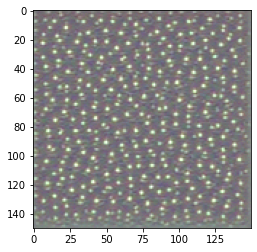

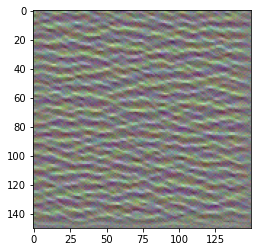

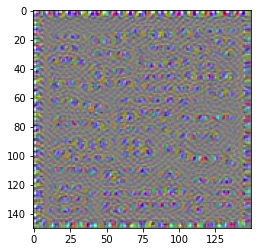

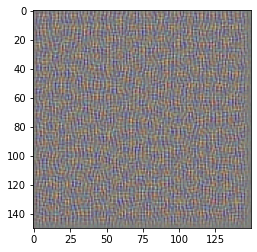

In [18]:
for i in range(4):
    plt.imshow(generate_pattern('block3_conv1', i))
    plt.show()

Wygląda na to, że filtr 0 w warstwie `block3_conv1` reaguje na wzór w kropki.

Teraz zwizualizujmy wszystkie filtry w każdej warstwie. Dla uproszczenia przyjrzymy się tylko pierwszym 64 filtrom w każdej warstwie i tylko wybranych warstw każdego bloku splotu (`block1_conv1`, `block1_conv2`, `block2_conv1`, `block2_conv2`, `block3_conv1`, `block3_conv2`, `block4_conv1`, `block4_conv2`, `block5_conv1`, `block5_conv2`). Wyjścia ułóżmy na siatce 8x8 z wzorami filtrów 64x64, z pewnymi czarnymi marginesami pomiędzy każdym wzorcem filtrów.

Layer name: block1_conv1


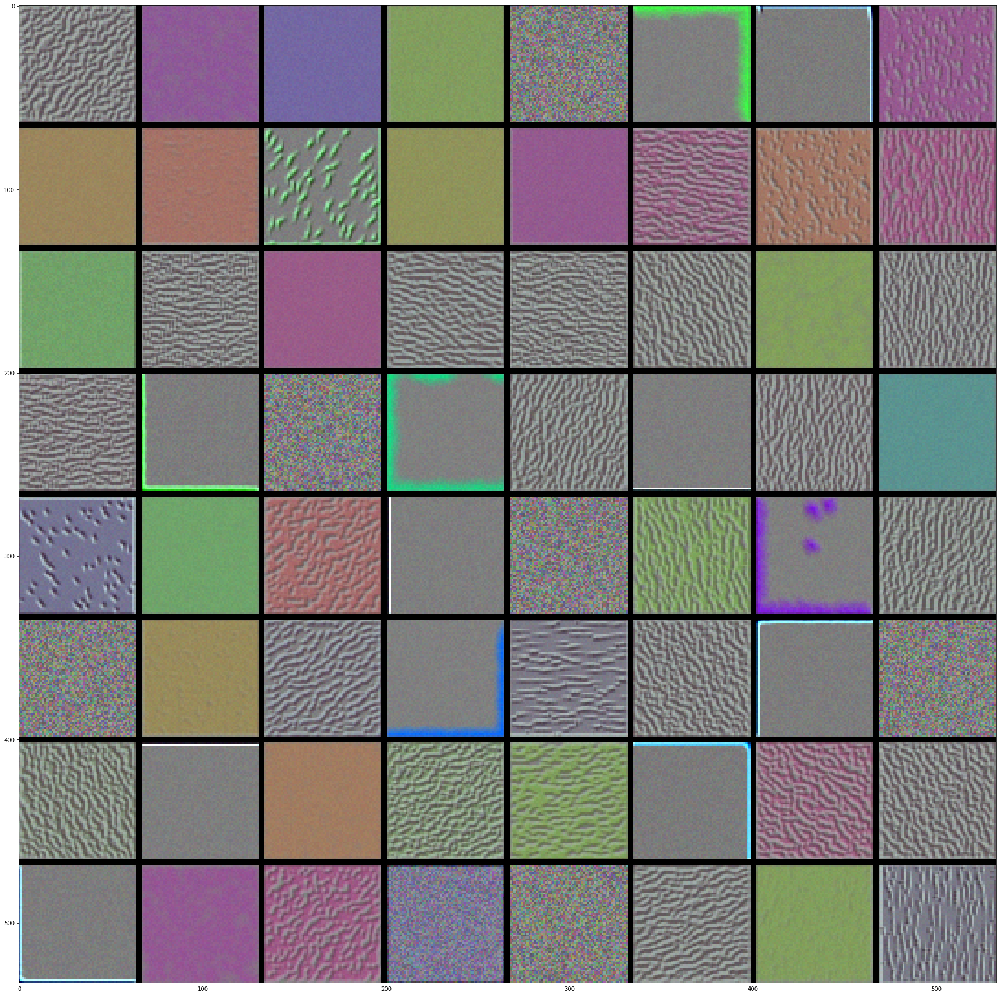

Layer name: block1_conv2


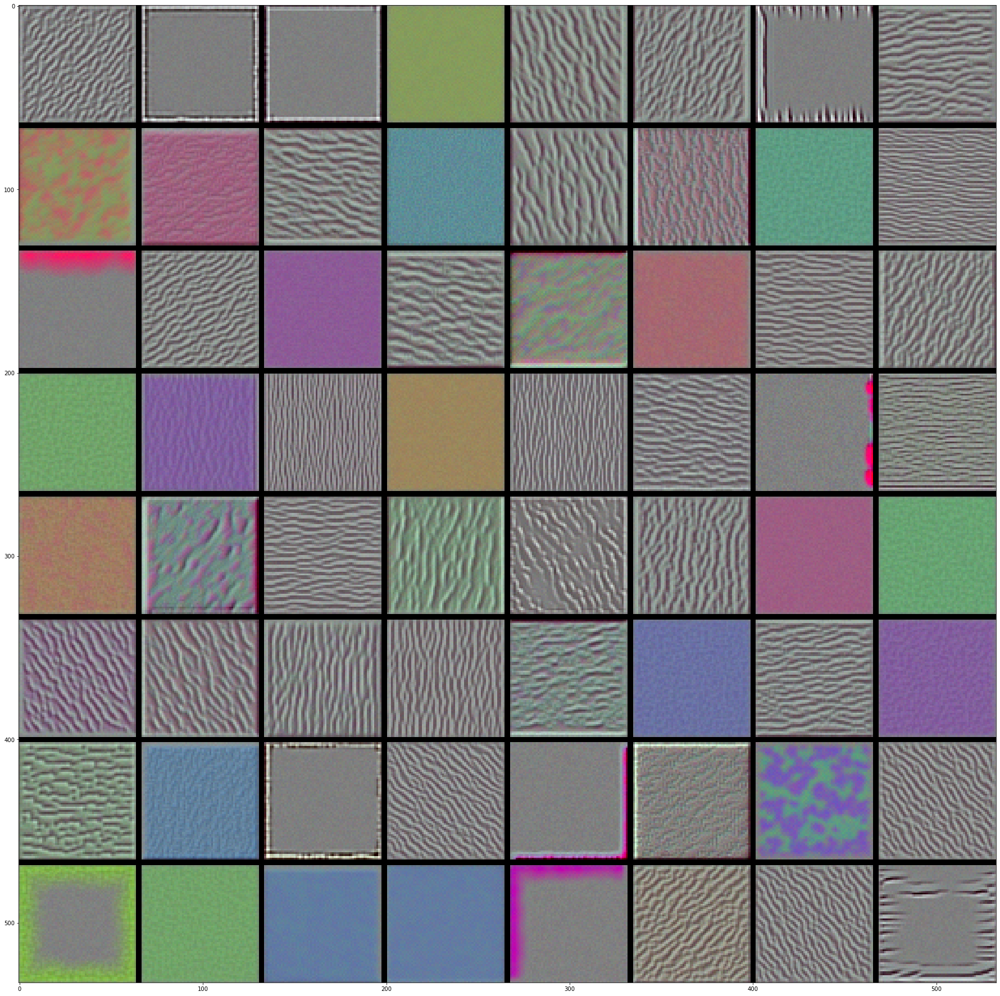

Layer name: block2_conv1


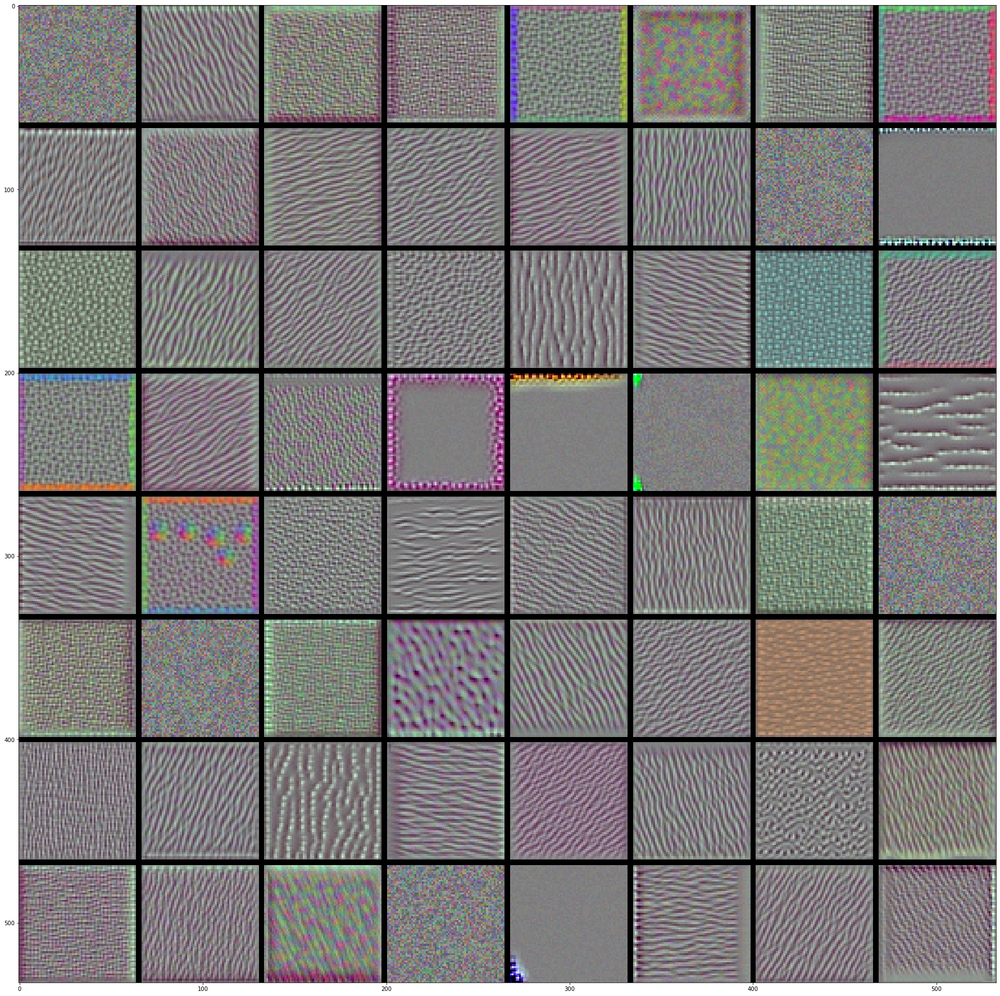

Layer name: block2_conv2


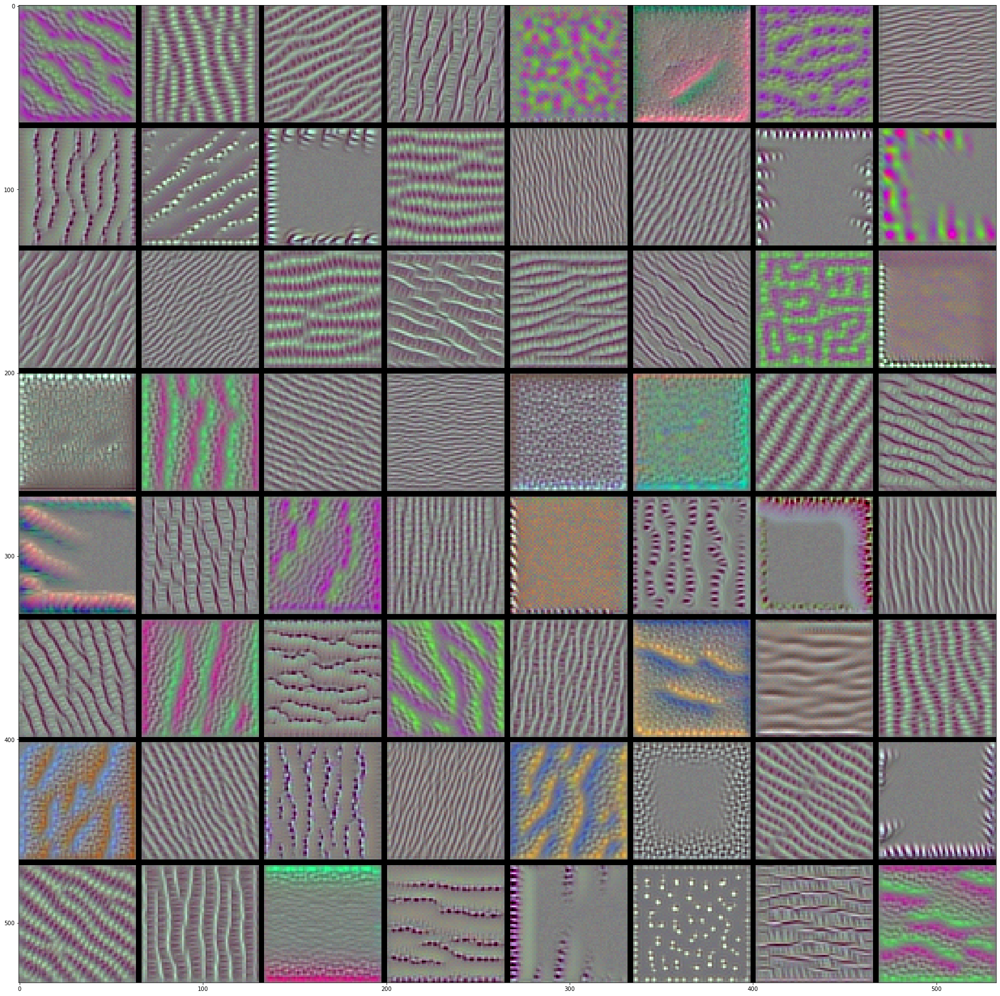

Layer name: block3_conv1


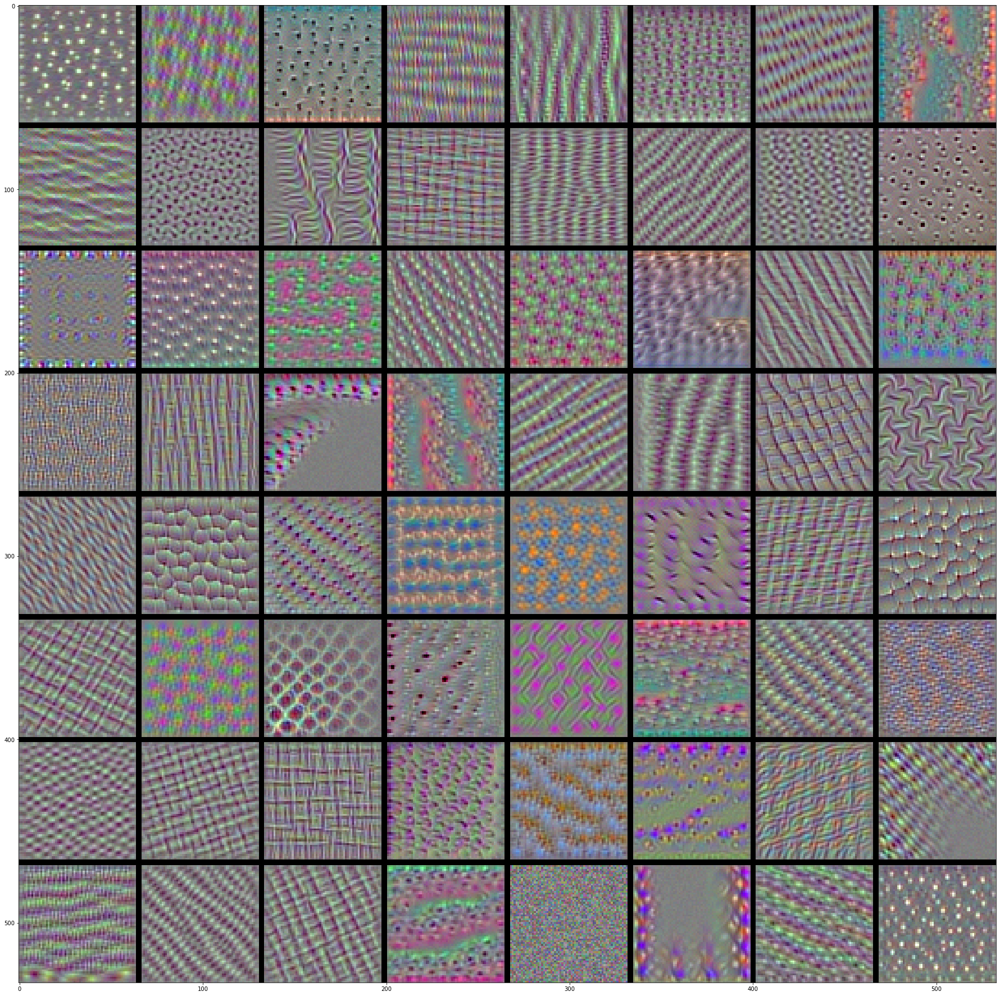

Layer name: block3_conv2


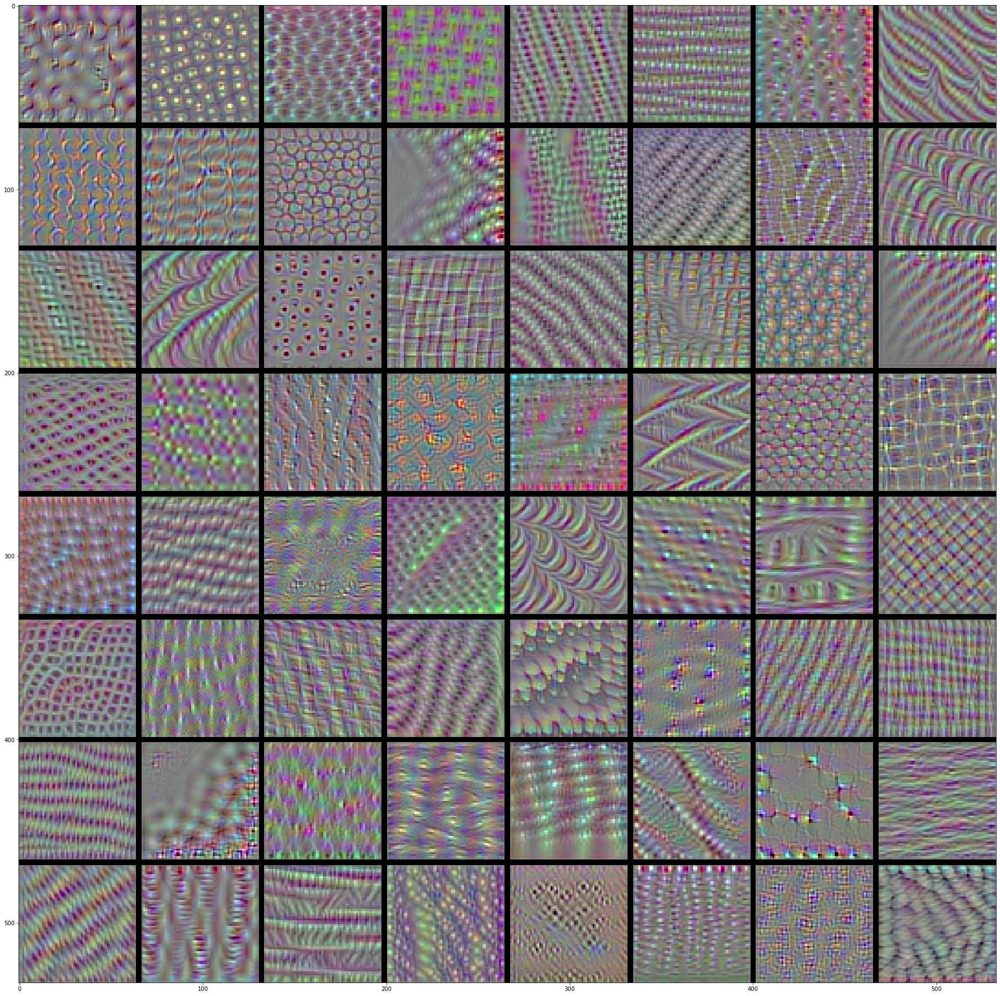

Layer name: block4_conv1


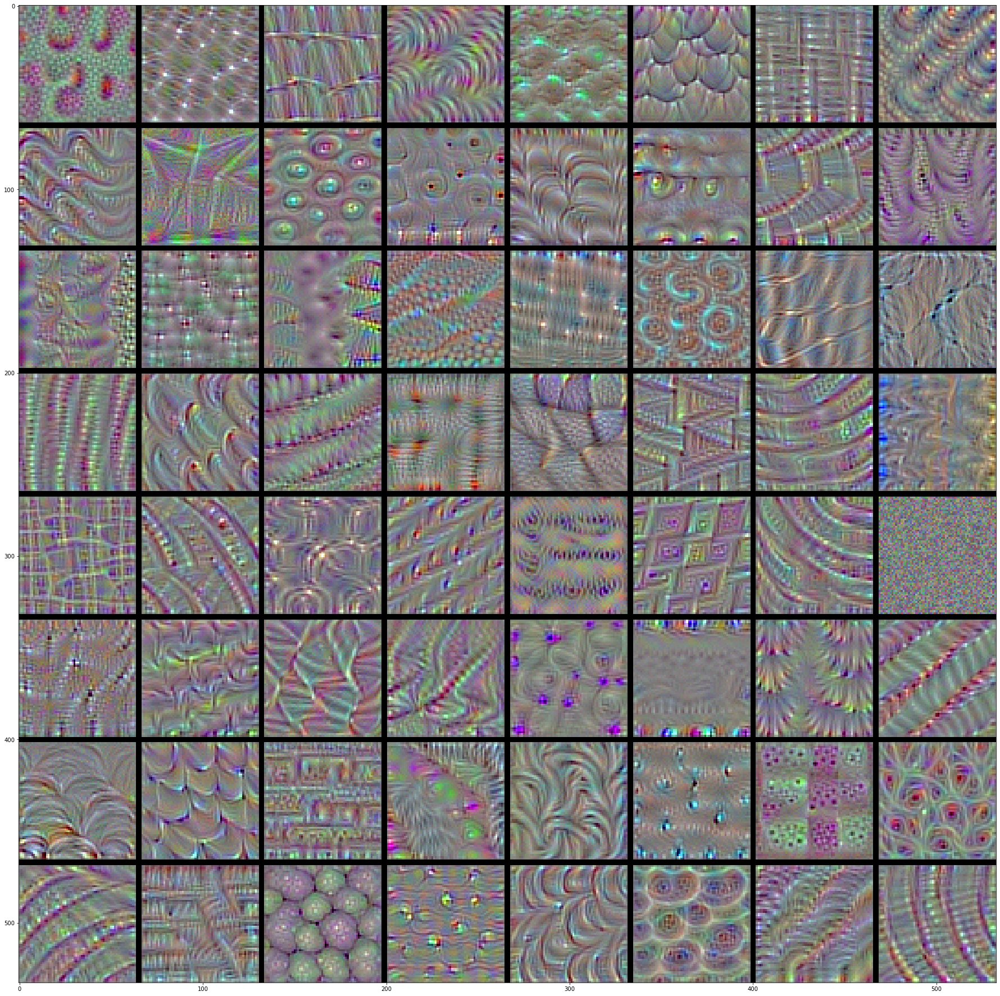

Layer name: block4_conv2


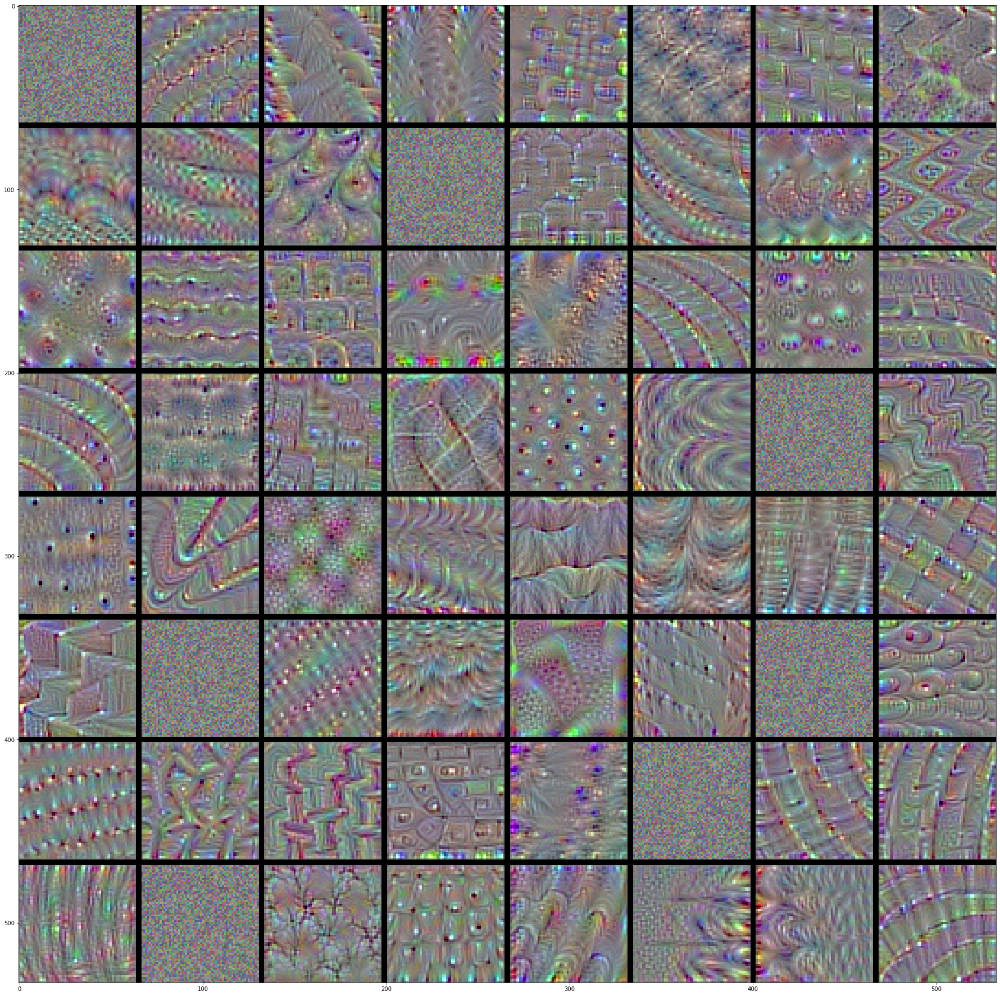

Layer name: block5_conv1


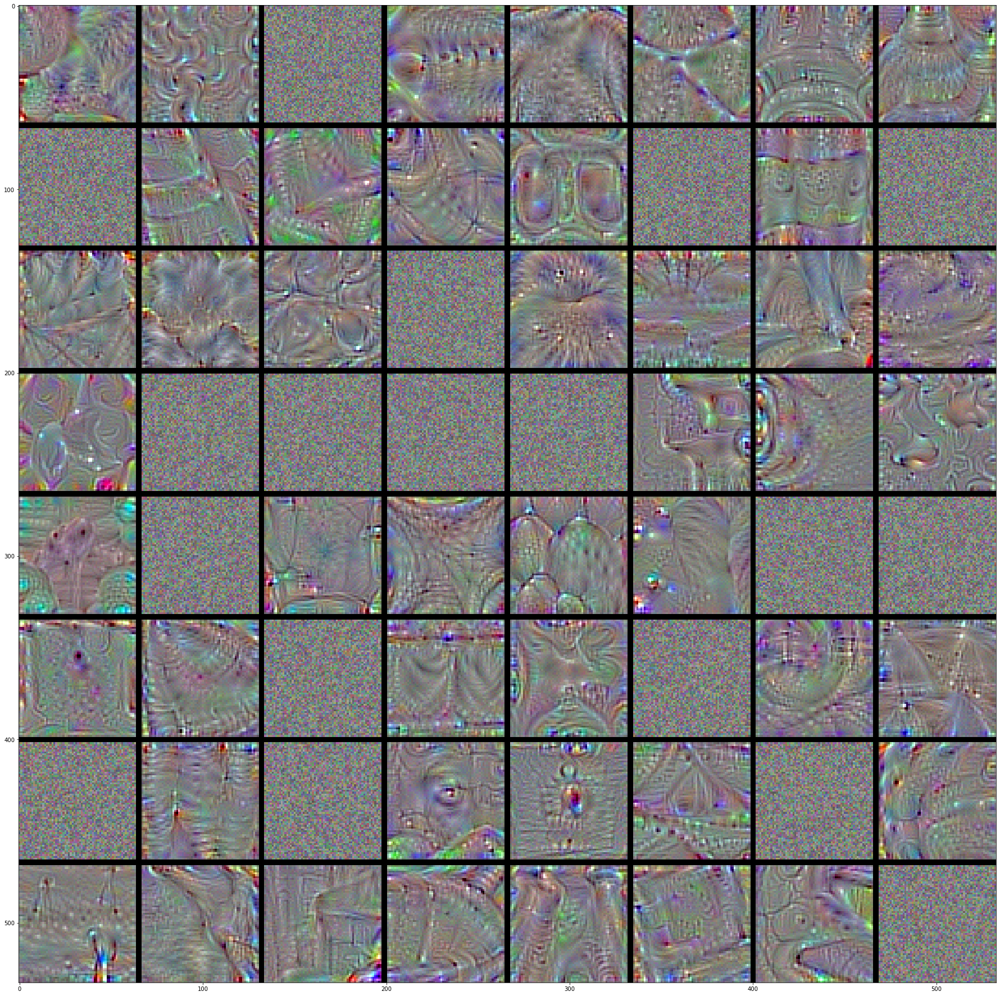

Layer name: block5_conv2


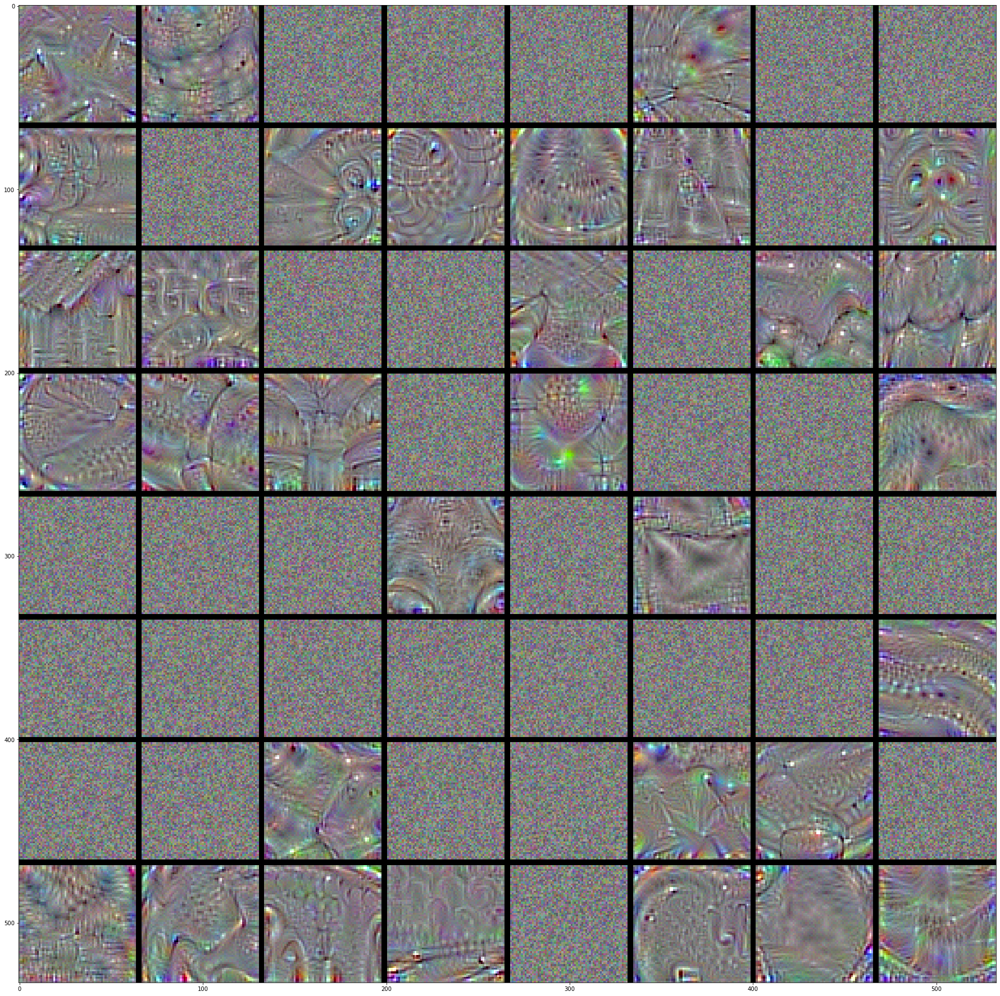

In [19]:
size = 64
margin = 3
no = 8

for layer_name in ['block1_conv1', 'block1_conv2', 'block2_conv1', 'block2_conv2', 'block3_conv1', 'block3_conv2', 'block4_conv1', 'block4_conv2', 'block5_conv1', 'block5_conv2']: 
    
    # This a empty (black) image where we will store our results.
    results = np.zeros((no * size + 7 * margin, no * size + 7 * margin, 3), dtype=np.uint8)

    for i in range(no):  # iterate over the rows of our results grid
        for j in range(no):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * no)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * no), size=size)
            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start : horizontal_end, vertical_start : vertical_end, : ] = filter_img

    # Display the results grid
    print("Layer name: " + layer_name)
    plt.figure(figsize=(size / 2, size / 2))
    plt.imshow(results)
    plt.show()

Te wizualizacje filtrów mówią nam wiele o tym, jak warstwy convnet postrzegają świat: każda warstwa w convnet po prostu uczy się zbioru filtrów, tak że ich dane wejściowe mogą być wyrażone jako kombinacja filtrów. Jest to podobne do tego, jak transformata Fouriera rozkłada sygnały na bank funkcji cosinusowych. Filtry w tych bankach filtrów convnet stają się coraz bardziej złożone i udoskonalane w miarę przechodzenia wyżej i wyżej w modelu:

* Filtry z pierwszej warstwy w modelu (`block1_conv1`) kodują proste krawędzie kierunkowe i kolory (lub kolorowe krawędzie w niektórych przypadkach).
* Filtry z `block2_conv1` kodują proste tekstury utworzone z kombinacji krawędzi i kolorów.
* Filtry w wyższych warstwach zaczynają przypominać tekstury występujące w naturalnych obrazach: pióra, oczy, liście itp.

Sprawdź i porównaj te filtry i spróbuj odpowiedzieć na następujące pytania:
* Które z przedstawionych powyżej filtrów wydają się nie przedstawiać niczego użytecznego (biały szum, losowe wartości) i mogą być „martwymi” filtrami?
* Które z przedstawionych powyżej filtrów wydają się przedstawiać te same lub bardzo podobne wzory w tej samej warstwie – zmniejszając pojemność warstwy i różnorodność filtrów stosowanych w kolejnych warstwach do dyskryminacji?
* Które z przedstawionych powyżej filtrów wydają się przedstawiać takie same lub podobne obrócone wzory?
* Które z przedstawionych powyżej filtrów wydają się reprezentować takie same lub podobne wzorce w różnej skali?

## 3. Wizualizacja map ciepła aktywacji klas

Wprowadzimy teraz technikę wizualizacji, która jest przydatna do zrozumienia, które części danego obrazu doprowadziły grupę do ostatecznej decyzji o określonej klasyfikacji. Jest to pomocne przy odpluskwianiu („debugowaniu”) procesu decyzyjnego w sieci, w szczególności w przypadku błędów klasyfikacyjnych. Pozwala nam także zlokalizować określone obiekty na obrazie.

Ta ogólna kategoria technik nosi nazwę wizualizacji __Mapa aktywacji klas (Class Activation Map (CAM))__ i polega na tworzeniu map ciepła __„aktywacji klas”__ na obrazach wejściowych. Mapa __„aktywacji klas”__ to dwuwymiarowa siatka wyników powiązanych z określoną klasą wyjściową, obliczane dla każdej lokalizacji w dowolnym obrazie wejściowym, wskazując, jak ważna jest każda lokalizacja w odniesieniu do rozważanej klasy. Na przykład, biorąc pod uwagę obraz wprowadzony do jednej z naszych sieci „kot kontra pies”, wizualizacja mapy aktywacji klasy pozwala nam wygenerować mapę cieplną dla klasy „kot”, wskazującą, jak różne części obrazu przypominają kota, i podobnie dla klasy „pies”, wskazująca, jak różne części obrazu przypominają psa.

Konkretna implementacja, której użyjemy, to ta opisana w [Grad-CAM: Why did you say that? Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/abs/1610.02391). Jest to stosunkowo proste: polega na pobraniu wyjściowej mapy cech warstwy konwolucyjnej, biorąc pod uwagę obraz wejściowy, i zważeniu każdego kanału na tej mapie cech według gradientu klasy w odniesieniu do kanału. Intuicyjnie, jednym ze sposobów zrozumienia tej sztuczki jest ważenie przestrzennej mapy, „jak intensywnie obraz wejściowy aktywuje różne kanały”, poprzez to, „jak ważny jest każdy kanał w odniesieniu do klasy”, co daje nam przestrzenną mapę, „jak intensywnie obraz wejściowy aktywuje klasę”.

Ponownie zademonstrujemy tę technikę przy użyciu wstępnie wytrenowanej (oryginalnej) sieci VGG16 na przykładzie obrazu słoni z tego zbioru:

In [20]:
from keras.applications.vgg16 import VGG16

K.clear_session()

# Note that we are including the densely-connected classifier on top; all previous times, we were discarding it.
model = VGG16(weights='imagenet')

Rozważmy poniższy obraz przedstawiający dwa słonie afrykańskie, prawdopodobnie matkę i jej młode, przechadzające się po sawannie (pod licencją "Creative Commons"):

![elephants](https://home.agh.edu.pl/~horzyk/ml/data/images/creative_commons_elephant.jpg)

Przekształćmy ten obraz w coś, co model VGG16 może odczytać: model został przeszkolony na obrazach o rozmiarze 224x244, wstępnie przetworzonych zgodnie z kilkoma regułami spakowanymi w funkcji narzędzia `keras.applications.vgg16.preprocess_input`. Musimy więc załadować obraz, zmienić jego rozmiar na 224x224, przekonwertować go na tensor Numpy float32 i zastosować te reguły przetwarzania wstępnego.

In [26]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

#base_dir_elephant = 'https://home.agh.edu.pl/~horzyk/ml/data/images/creative_commons_elephant.jpg'
base_dir_elephant = 'C:/ml/data/'

# The local path to our target image
img_path = base_dir_elephant + 'creative_commons_elephant.jpg'

# `img` is a PIL image of size 224x224
img = image.load_img(img_path, target_size=(224, 224))

# `x` is a float32 Numpy array of shape (224, 224, 3)
x = image.img_to_array(img)

# We add a dimension to transform our array into a "batch" of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch (this does channel-wise color normalization)
x = preprocess_input(x)

In [27]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

C:\Users\Adrian\anaconda3\lib\site-packages\keras\engine\training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


35363/35363 [==============================] - 0s 4us/step
Predicted: [('n02504458', 'African_elephant', 0.90942115), ('n01871265', 'tusker', 0.08618289), ('n02504013', 'Indian_elephant', 0.004354583)]


Trzy najlepsze klasy przewidziane dla tego obrazu to:

* Słoń afrykański (z prawdopodobieństwem 90,9%)
* Tusker (z prawdopodobieństwem 8,6%)
* Słoń indyjski (z prawdopodobieństwem 0,4%)

W ten sposób nasza sieć rozpoznała, że nasz obraz zawiera nieokreśloną liczbę słoni afrykańskich. Wpis w wektorze predykcji, który został maksymalnie aktywowany, odpowiada klasie „słonia afrykańskiego” pod indeksem 386:

In [28]:
np.argmax(preds[0])

386

Aby zwizualizować, które części tego obrazu najbardziej przypominają (wytrenowanej sieci) „słonia afrykańskiego”, skonfigurujmy proces Grad-CAM:

In [29]:
# This is the "african elephant" entry in the prediction vector
#african_elephant_output = model.output[:, 386]
african_elephant_output = model.output[:, np.argmax(preds[0])]

# The is the output feature map of the `block5_conv3` layer,
# the last convolutional layer in VGG16
last_conv_layer = model.get_layer('block5_conv3')

# This is the gradient of the "african elephant" class with regard to
# the output feature map of `block5_conv3`
grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]

# This is a vector of shape (512,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of `block5_conv3`,
# given a sample image
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of two elephants
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the elephant class
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

Dla celów wizualizacji znormalizujemy również mapę cieplną między 0 a 1:

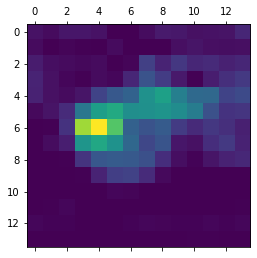

In [30]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

Na koniec użyjemy OpenCV do wygenerowania obrazu, który nakłada oryginalny obraz na mapę cieplną, którą właśnie uzyskaliśmy:

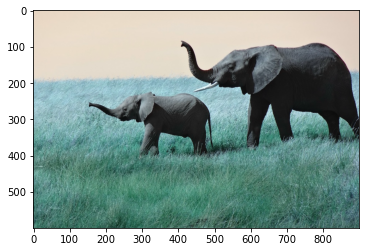

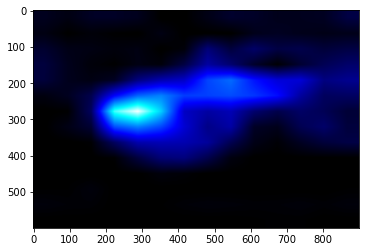

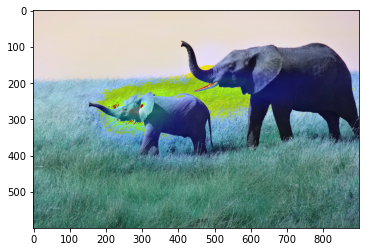

C:/ml/data/elephant_cam.jpg


In [31]:
# pip install opencv-python
# Install opencv before running this cell
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)
plt.imshow(img)
plt.show()

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_HOT)
plt.imshow(heatmap)
plt.show()

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.3 + img
superimposed_img = superimposed_img.astype('uint8')

plt.imshow(superimposed_img)
plt.show()

# Save the image to disk
cv2.imwrite(base_dir_elephant + 'elephant_cam.jpg', superimposed_img)

print(base_dir_elephant + 'elephant_cam.jpg')

![elephant cam](https://home.agh.edu.pl/~horzyk/ml/data/images/elephant_cam.jpg)

Ta technika wizualizacji odpowiada na dwa ważne pytania:

* Dlaczego sieć uznała, że to zdjęcie przedstawia słonia afrykańskiego?
* Gdzie na obrazku znajduje się słoń afrykański (które cechy obrazku o tym świadczą lub też na które obszary obrazu sieć zwróciła uwagę w trakcie klasyfikacji)?

W szczególności warto zauważyć, że uszy młodego słonia są silnie wskazane (aktywowane): prawdopodobnie w ten sposób sieć może rozpoznać różnicę między słoniami afrykańskimi i indyjskimi.

## Zadania (2 punkty)

* Zidentyfikuj podobne wyniki dla każdej warstwy i dowiedz się, w jakim stopniu Twój model jest niewystarczająco wytrenowany i czy Twoje filtry dublują reprezentowane cechy/wzorce, czyli są identyczne lub mają bardzo podobne? Porównaj zidentyfikowane podobne wyjścia („Wizualizacja pośrednich aktywacji”) z widokami filtrów w drugiej części „Wizualizacja filtrów ConvNet” i sprawdź, czy filtry rzeczywiście wyglądają tak samo lub podobnie.
* Najpierw wybierz podobnie wyglądające wyjścia i/lub filtry (możesz wybrać je automatycznie, np. obliczając ich średnie, korelacje, czy odległość Euklidesa). Po drugie, zestaw wyjścia i filtry, które wyglądają podobnie i chcesz je porównać i sprawdzić ich podobieństwo, aby zobaczyć oba widoki obok siebie. Na koniec wyciągnij wnioski na temat możliwej skuteczności i bogactwu przedstawionych filtrów w Twojej sieci.
* Wytrenuj tę samą sieć kilka razy i porównaj ich widoki wyjść i filtrów i sprawdź, jak dokładność (`accuracy`) i strata (`loss`) modelu oraz jego ewentualne przeuczenie (`overfitting`) są powiązane z tymi widokami i skutecznością reprezentacji wzorców w Twoich modelach?
* Wybierz różne obrazy i sprawdź, czy „martwe” filtry występują dla różnych obrazów wejściowych.
* Policz liczbę wystąpień „martwych” filtrów dla każdego filtra w sieci dla wszystkich obrazów zbioru danych. Porównaj wyniki i wyciągnij wnioski.
* Odfiltruj nieprawidłowo sklasyfikowane obrazy (po zakończeniu procesu uczenia modelu) i użyj techniki „Wizualizacja map ciepła aktywacji klas”, aby zobaczyć, na jakich cechach skupił się Twój model podczas ich klasyfikacji? Spróbuj znaleźć przyczynę (powody) nieprawidłowej klasyfikacji. Czy model koncentrował się na cechach obiektów czy na tle? Jeśli na tle, spróbuj odpowiedzieć na pytanie, na ilu obrazach takie tło lub podobne występuje w zbiorze danych? Wyciągnij wnioski.
* Spróbuj użyć funkcji `generate_pattern` dla różnych indeksów filtrów, nie tylko tych przedstawionych powyżej.
* Na koniec użyj innego zestawu danych, np. z <a href="www.kaggle.com">Kaggle.com</a> lub innego źródła i zwizualizuj:
<ol>
    <li>pośrednie aktywacje,</li>
    <li>filtry połączeń,</li>
    <li>mapy cieplne aktywacji klas na obrazie.</li>
    <li>wykonaj podobne eksperymenty, jak opisano w zadaniach powyżej, i porównaj, czy te same rzeczy mają miejsce również w innym zbiorze danych?</li>
    <li>spróbuj zmienić funkcję aktywacji ReLU na inną i porównaj wydajność, dokładność i stratę modelu po tej samej liczbie epok treningowych oraz sprawdź filtry pod kątem liczby „martwych” lub podobnych filtrów.
</ol>

## Zadania opcjonalne (5 - 30 punktów)
### Liczba punktów zależy od zastosowanych rozwiązań, jakości kodu i osiągniętych wyników, może być zaliczona również jako projekt końcowy (badawczy), jeśli zostanie wykonane bardzo dobrze.

* Spróbuj znaleźć lekarstwo na problemy, które ujawniłeś w poprzednich zadaniach:
* Spróbuj zmienić zakres danych wejściowych z $[0,1]$ na $[-1,1]$ i nie używaj ReLU (ponieważ ReLU będzie działać tak samo dla 0 jak dla -1, wypróbuj LeakyReLU , PRELU, ELU, ...), aby umożliwić sieci skupienie się nie tylko na wystąpieniu najsilniejszych cech (<b>obecnych cech</b>) (wybranych w warstwach `MaxPooling`) reprezentujących `komórki ON`, ale także na <b>braku cech</b> reprezentujących `komórki OFF` układu wzrokowego (-1 (wejście) * wagi ujemne ==> wartości dodatnie, które mogą być wybrane przez `MaxPooling`). W takim przypadku może być konieczne użycie większej liczby filtrów w warstwach, ponieważ liczba możliwych kombinacji obecnych i nieobecnych obiektów jest większa niż tylko skupiając się na obecnych.
* Spróbuj rozwiązać problem "martwych" filtrów (których wagi wyglądają jak biały szum i nie dostosowały się od początku procesu uczenia, kiedy zostały zainicjowane w sposób losowy). Oblicz liczbę wystąpień takich „martwych” filtrów, wybierz te, które występują zbyt często, zakończ proces uczenia, gdy to nastąpi, ponownie zainicjuj te filtry, zamroź na chwilę inne wagi filtrów i spróbuj wytrenować reinicjowane filtry. Możesz ponownie zainicjować „martwe” filtry losowymi liczbami (ale wagi powinny uwzględniać średnią innych filtrów, aby ponownie nie były zbyt małe). Możesz także spróbować ponownie je zainicjować, używając w jakiś sposób niereprezentowanych (nie wykrytych) jeszcze obszarów woluminu wejściowego, tj. takich, na które na razie nie reaguje wystarczająco żaden filtr lub `MaxPooling` nie pozwala tym cechom przejść dalej.
* Spróbuj znaleźć podobne filtry za pomocą średnich, korelacji lub odległości Euklidesa i zrób to samo, co w przypadku „martwych” filtrów. Zbyt podobne filtry są zwykle zbędne i ograniczają zdolność adaptacji modelu. Spróbuj więc je zmienić, ponownie zainicjować, zamrażając pozostałe na jakiś czas, aby nie zepsuć reprezentacji innych filtrów.

Najlepsze modele, projekty i wyniki mogą zostać rozszerzone do pracy inżynierskiej i/lub artykułów naukowych, np. na konferencję naukową, tj. <a href="https://ecai2023.eu/">ECAI 2023</a> (konferencja klasy A), która odbędzie się w Krakowie w dniach 1-6 października.